In [1]:
# pip install -U scikit-learn


In [2]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model

import os
import shutil
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras import models, layers
from tensorflow.keras.applications.vgg16 import preprocess_input



In [3]:
# Define the path to your images
image_directory = '/Users/kajalshukla/Desktop/DS in Healthcare/healthcare/Assingment_3/cell_images'



In [4]:
# Initialize the data generator with rescaling
datagen = ImageDataGenerator(rescale=1./255)



In [5]:
batch_size = 5
# Load images from the directory
generator = datagen.flow_from_directory(
    image_directory,
    target_size=(224, 224),  
    batch_size=batch_size,            
    class_mode='binary',     
    shuffle=False            
)


Found 27558 images belonging to 2 classes.


In [6]:

# Get a batch of images
batch = next(generator)

# The batch is a tuple of (images, labels)
images, labels = batch


In [7]:
len(images)

5

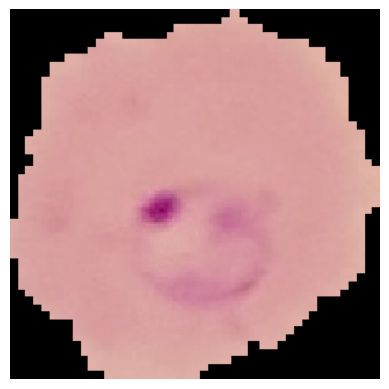

In [8]:
# Assuming you have a batch of one image
image = images[0]  # Get the first image in the batch

# Display the image
plt.imshow(image)
plt.axis('off')  # Hide the axes
plt.show()


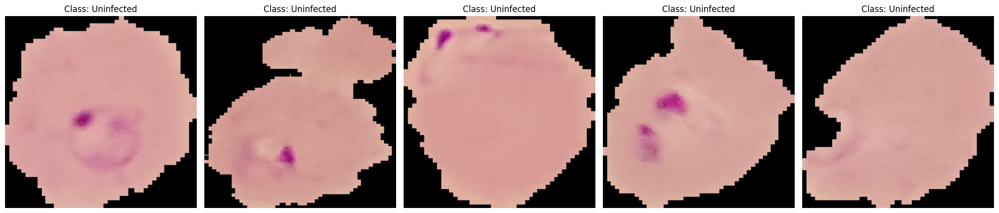

In [9]:
# Assuming 'images' and 'labels' are your loaded batch of images and corresponding labels
fig, axes = plt.subplots(1, len(images), figsize=(20, 20))  # Adjust the subplot grid as necessary
axes = axes.flatten()  # Flatten the axes array, if necessary

for img, lbl, ax in zip(images, labels, axes):
    ax.imshow(img)
    ax.set_title(f'Class: {"Parasitized" if lbl == 1 else "Uninfected"}')  # Set the title based on the label
    ax.axis('off')  # Hide the axes

plt.tight_layout()
plt.show()


In [10]:
conv_base = VGG16(weights = "imagenet",
include_top = False)
conv_base.summary()


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

# Extract the features and labels

In [11]:
num_samples = generator.samples
batch_size = generator.batch_size
features = np.zeros(shape=(num_samples, 7, 7, 512))  # Adjust shape based on the output of conv_base
labels = np.zeros(shape=(num_samples))


In [12]:
# Make sure to replace 'generator' with your actual generator that produces input batches
for inputs_batch, labels_batch in generator:
    # Use the first batch from your generator to get the output shape
    sample_features_batch = conv_base.predict(inputs_batch)
    break  # We only need the first batch to determine the output shape

# Now, sample_features_batch contains the output from conv_base for one batch
# The shape of this output will guide us in creating the features array
print(sample_features_batch.shape)


1/1 [==============================] - 1s 540ms/step
(5, 7, 7, 512)


In [13]:
def extract_features_and_labels(generator, conv_base, batch_size, num_samples):
    features = np.zeros(shape=(num_samples, 7, 7, 512))  
    labels = np.zeros(shape=(num_samples))
    i = 0
    for inputs_batch, labels_batch in generator:
        features_batch = conv_base.predict(inputs_batch)
        batch_end = i * batch_size + inputs_batch.shape[0]
        features[i * batch_size: batch_end] = features_batch
        labels[i * batch_size: batch_end] = labels_batch
        i += 1
        if batch_end >= num_samples:
            break
    return features, labels




In [14]:
features, labels = extract_features_and_labels(generator, conv_base, batch_size, num_samples)

1/1 [==============================] - 0s 473ms/step


## SPLIT THE DATA INTO TRAIN/TEST/VALIDATION

In [10]:
# Directory where you want to store the new dataset structure
base_output = '/Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/new_data'

# Split ratios
train_ratio = 0.7
validation_ratio = 0.15
test_ratio = 0.15

# Subdirectories for the image categories
categories = ['Parasitized', 'Uninfected']


In [11]:
# Loop over the categories
for category in categories:
    # Create full path to the category directory
    category_path = os.path.join(image_directory, category)
    print(f"Category path: {category_path}")

    if not os.path.exists(category_path):
        print(f"Directory does not exist: {category_path}")
    else:
        print(f"Directory exists: {category_path}")

    # Get all images in the category directory
    image_paths = [os.path.join(category_path, img) for img in os.listdir(category_path)]
    print(image_paths)

    
    # # Split the data into train/validation/test
    train_val, test_data = train_test_split(image_paths, test_size=test_ratio, random_state=42)
    train_data, val_data = train_test_split(train_val, test_size=validation_ratio/(train_ratio+validation_ratio), random_state=42)

Category path: /Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/cell_images/Parasitized
Directory exists: /Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/cell_images/Parasitized
['/Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/cell_images/Parasitized/C118P79ThinF_IMG_20151002_105018_cell_150.png', '/Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/cell_images/Parasitized/C189P150ThinF_IMG_20151203_142224_cell_84.png', '/Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/cell_images/Parasitized/C91P52ThinF_IMG_20150821_123116_cell_189.png', '/Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/cell_images/Parasitized/C84P45ThinF_IMG_20150818_101226_cell_98.png', '/Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria

In [12]:
# Function to copy files
def copy_files(data, data_type, category):  # Pass 'category' as a parameter here
    for path in data:
        # Extract the filename and build the destination path
        filename = os.path.basename(path)
        dest_dir = os.path.join(base_output, data_type, category)
        dest_path = os.path.join(dest_dir, filename)
        
        # Create directory if it does not exist
        if not os.path.exists(dest_dir):
            os.makedirs(dest_dir)
        
        # Copy the file
        shutil.copy2(path, dest_path)
        print(f"Copied {filename} to {dest_dir}")

# Loop over the categories
for category in categories:
    # ... (rest of your code for splitting the data)

    # Copy the images to the respective folders
    # Pass 'category' as an argument to 'copy_files'
    copy_files(train_data, 'train', category)
    copy_files(val_data, 'validation', category)
    copy_files(test_data, 'test', category)


Copied C186P147NThinF_IMG_20151203_150859_cell_134.png to /Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/new_data/train/Parasitized
Copied C99P60ThinF_IMG_20150918_141129_cell_84.png to /Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/new_data/train/Parasitized
Copied C99P60ThinF_IMG_20150918_141520_cell_73.png to /Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/new_data/train/Parasitized
Copied C116P77ThinF_IMG_20150930_171635_cell_68.png to /Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/new_data/train/Parasitized
Copied C237ThinF_IMG_20151127_105345_cell_153.png to /Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-Detection-with-Deep-Learning/new_data/train/Parasitized
Copied C155P116ThinF_IMG_20151115_143330_cell_55.png to /Users/kajalshukla/Desktop/DS in Healthcare/Assignment_4/Malaria-

In [13]:
# Define new data generators for the organized directories
train_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=preprocess_input)
val_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(rescale=1./255, preprocessing_function=preprocess_input)


In [14]:
# Now you can create the generators
train_generator = train_datagen.flow_from_directory(
    os.path.join(base_output, 'train'),
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)

Found 19290 images belonging to 2 classes.


In [15]:
test_generator = test_datagen.flow_from_directory(
    os.path.join(base_output, 'test'),  # make sure this is the path to your test folder
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)

Found 4134 images belonging to 2 classes.


In [16]:
val_generator = val_datagen.flow_from_directory(
    os.path.join(base_output, 'validation'),  # make sure this is the path to your validation folder
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)

Found 4134 images belonging to 2 classes.


In [24]:
# Initialize the feature extraction process
# Decide on the number of samples and the batch size
num_samples = train_generator.samples
batch_size = train_generator.batch_size
features_train = np.zeros(shape=(num_samples, 7, 7, 512))  # Adjust shape based on the output of conv_base
labels_train = np.zeros(shape=(num_samples))


In [25]:
# Extract features using the VGG16 convolutional base
i = 0
for inputs_batch, labels_batch in train_generator:
    features_batch = conv_base.predict(inputs_batch)
    features_train[i * batch_size : (i + 1) * batch_size] = features_batch
    labels_train[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    if i * batch_size >= num_samples:
        break

1/1 [==============================] - 3s 3s/step


KeyboardInterrupt: 

In [ ]:
# First, make sure you have the correct number of samples for the test set
num_samples_test = test_generator.samples

# Initialize arrays to hold the test features and labels
features_test = np.zeros(shape=(num_samples_test, 7, 7, 512))  # The shape should match the output of conv_base
labels_test = np.zeros(shape=(num_samples_test))

# Extract features and labels from the test set
i = 0
for inputs_batch, labels_batch in test_generator:
    features_batch = conv_base.predict(inputs_batch)
    # Note that we are now filling up `features_test` and `labels_test`
    features_test[i * batch_size : (i + 1) * batch_size] = features_batch
    labels_test[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    # Make sure the loop breaks when all test samples are processed
    if i * batch_size >= num_samples_test:
        break


In [ ]:
# First, determine the number of validation samples
num_samples_val = val_generator.samples

# Initialize arrays to hold the validation features and labels
features_val = np.zeros(shape=(num_samples_val, 7, 7, 512))  # The shape should match the output of conv_base
labels_val = np.zeros(shape=(num_samples_val))

# Extract features and labels from the validation set
i = 0
for inputs_batch, labels_batch in val_generator:
    features_batch = conv_base.predict(inputs_batch)
    features_val[i * batch_size : (i + 1) * batch_size] = features_batch
    labels_val[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    # Make sure the loop breaks when all validation samples are processed
    if i * batch_size >= num_samples_val:
        break


In [27]:
# Predict the features for training data
# train_features = conv_base.predict(train_generator, steps=len(train_generator))


In [17]:
# Step 3: Train a Classifier
# Define the classifier model
classifier_model = models.Sequential()
classifier_model.add(layers.Dense(256, activation='relu', input_dim=train_features.shape[1]))
classifier_model.add(layers.Dropout(0.5))
classifier_model.add(layers.Dense(1, activation='sigmoid'))


In [18]:
# Display the full model's architecture
classifier_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_1 (Dense)             (None, 256)               6422784   
                                                                 
 dense_2 (Dense)             (None, 1)                 257       
                                                                 
Total params: 21137729 (80.63 MB)
Trainable params: 21137729 (80.63 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Compile the model
classifier_model.compile(optimizer='rmsprop',
                         loss='binary_crossentropy',
                         metrics=['accuracy'])

In [ ]:
# For training, you use the features as input and the labels from the generator
classifier_model.fit(train_features, train_generator.classes, epochs=10, batch_size=20)